1. <a href="#overview_destination">Overview</a>
2. <a href="#cleaning_destination">Cleaning Data</a>
3. <a href="#transform_destination">Transformation</a>
4. <a href="#eda_destination">EDA</a>
5. <a href="#modeling_destination">Modeling</a>

<a id="overview_destination"></a>
## Overview

This notebook demonstrates exploratory data analysis as well as attempts to construct a prediction model to guess the outcome of USA presidential 2016 election based on past electionas as well as demographic data available.

We will inspect and clean the dataset as and when necessary. Afterwards, let's perform some exploratory data analysis to understand the US elections a bit more in depth. Finally, we'll attempt some modeling to predict the 2016 prediction outcome.

In [1180]:
#import necessary libraries
import numpy as np
import pandas as pd

<a id="cleaning_destination"></a>
## Data Cleaning

In [1181]:
census_data_df = pd.read_csv('data.csv')
votes_df = pd.read_csv('votes.csv')
ec_df = pd.read_csv('ec.csv')

In [1182]:
for col in census_data_df.columns:
    print(census_data_df[col].describe())
    print(census_data_df[col].head())

count      3141
unique       51
top       Texas
freq        254
Name: State, dtype: object
0    Arkansas
1    Arkansas
2     Georgia
3    Colorado
4     Georgia
Name: State, dtype: object
count     3140
unique      51
top         TX
freq       254
Name: ST, dtype: object
0    AR
1    AR
2    GA
3    CO
4    GA
Name: ST, dtype: object
count     3141.00000
mean     30406.52149
std      15156.09339
min       1001.00000
25%      18181.00000
50%      29179.00000
75%      45083.00000
max      56045.00000
Name: Fips, dtype: float64
0     5043
1     5087
2    13159
3     8037
4    13091
Name: Fips, dtype: int64
count                           3141
unique                          3141
top       Roscommon County, Michigan
freq                               1
Name: County, dtype: object
0       Drew County, Arkansas
1    Madison County, Arkansas
2      Jasper County, Georgia
3      Eagle County, Colorado
4       Dodge County, Georgia
Name: County, dtype: object
count    3109.000000
mean       54.

### Finding data structure of the census data set
Column Name | Data Type | Definition | Remark
--- | --- | --- | ---
state|string|name of state|
st|string|abbreviation of state name OR state code|
fips|string|county code|
county|string|county name,state|
precincts|float|number of precincts in the county|
votes|float|number of votes from that county|
less than high school diploma|float|percentage of population with less than high school dip|
at least high school diploma|float|percentage of population with at least high school dip|
at least bachelors' degree|float|percentage of population with at least bachelor degree|
graduate degree|float|percentage of population with graduate degree|
school enrollment|float|number of high school enrollment?|the data are in float type and has decimal values
median earnings 2010|float|median earning in dollar values
white (not latino) population|float|number of residents who are white (not latino)
african american population|float|populatio of african american|
asian american population|float|population of asian american|
other race or races|float|population of other races|
latino population|float|population of latino american|
children under 6 living in poverty|float|% of children under 6 living in poverty|looks like percentage
adults 65 and older living in poverty|float|%|
total population|float|no. of population|
Preschool.Enrollment.Ratio.enrolled.ages.3.and.4|float|%|
Poverty.Rate.below.federal.poverty.threshold|float|%|
Gini.Coefficient|float|ratio|
Child.Poverty.living.in.families.below.the.poverty.line|float|%|
Management.professional.and.related.occupations|float|%|
Service.occupations|float|%|
Sales.and.office.occupations|float|%|
Farming.fishing.and.forestry.occupations|float|%|
Construction.extraction.maintenance.and.repair.occupations|float|%|
White|float|%|
Black|float|%|
Hispanic|float|%|
Asian|float|%|
Amerindian|float|%|
Other|float|%|
White_Asian|float|%|
SIRE_homogeneity|float|% of self-identified race/ethnicity population|
median_age|float|computed median age|
Low.birthweight|float|ratio|?
Teen.births|float|%|
Children.in.single.parent.households|float|ratio|
Adult.smoking|float|ratio|
Adult.obesity|float|ratio|
Diabetes|float|ratio|
Sexually.transmitted.infections|float|average|?
HIV.prevalence.rate|float|average|?
Uninsured|float|ratio|
Unemployment|float|ratio|
Violent.crime|float|average|?
Homicide.rate|float|average|?
Injury.deaths|float|average|?
Infant.mortality|float|%|

In [1183]:
print(census_data_df.isnull().sum())

State                                                            0
ST                                                               1
Fips                                                             0
County                                                           0
Precincts                                                       32
Votes                                                           32
Less Than High School Diploma                                    0
At Least High School Diploma                                     0
At Least Bachelors's Degree                                      0
Graduate Degree                                                  0
School Enrollment                                                0
Median Earnings 2010                                             0
White (Not Latino) Population                                    0
African American Population                                      0
Native American Population                                    

In [1184]:
print(census_data_df[census_data_df['ST'].isnull()])
print(census_data_df[census_data_df['State']=='Virginia']['ST'].describe())

         State   ST   Fips                  County  Precincts  Votes  \
3115  Virginia  NaN  51515  Bedford city, Virginia        NaN    NaN   

      Less Than High School Diploma  At Least High School Diploma  \
3115                           15.5                          84.5   

      At Least Bachelors's Degree  Graduate Degree        ...         \
3115                         20.8              7.9        ...          

      Adult.obesity  Diabetes  Sexually.transmitted.infections  \
3115          0.301     0.128                            323.6   

      HIV.prevalence.rate  Uninsured  Unemployment  Violent.crime  \
3115                343.9      0.155         0.086         297.03   

      Homicide.rate  Injury.deaths  Infant.mortality  
3115            NaN           97.2               NaN  

[1 rows x 54 columns]
count     133
unique      1
top        VA
freq      133
Name: ST, dtype: object


Record No. 3115 is the only record with missing ST code. All records which belong to Virginia has ST value "VA". Hence, I'll replace the NaN with string "VA".

In [1185]:
#filling the NaN value with "VA"
census_data_df.loc[3115,'ST']="VA"

In [1186]:
print(census_data_df.isna().sum())

State                                                            0
ST                                                               0
Fips                                                             0
County                                                           0
Precincts                                                       32
Votes                                                           32
Less Than High School Diploma                                    0
At Least High School Diploma                                     0
At Least Bachelors's Degree                                      0
Graduate Degree                                                  0
School Enrollment                                                0
Median Earnings 2010                                             0
White (Not Latino) Population                                    0
African American Population                                      0
Native American Population                                    

In [1187]:
census_data_df[census_data_df['State']=='Hawaii']

,State,ST,Fips,County,Precincts,Votes,Less Than High School Diploma,At Least High School Diploma,At Least Bachelors's Degree,Graduate Degree,...,Adult.obesity,Diabetes,Sexually.transmitted.infections,HIV.prevalence.rate,Uninsured,Unemployment,Violent.crime,Homicide.rate,Injury.deaths,Infant.mortality
2100,Hawaii,HI,15003,"Honolulu County, Hawaii",153.0,285683.0,10.10,89.90,31.10,10.6,...,0.218,0.089,497.5,200.7,0.073,0.052,264.00,2.00,45.7,6.7
2101,Hawaii,HI,15001,"Hawaii County, Hawaii",43.0,64865.0,9.50,90.50,26.60,8.1,...,0.241,0.082,312.2,198.8,0.106,0.083,267.20,2.19,67.9,7.0
2237,Hawaii,HI,15007,"Kauai County, Hawaii",16.0,26335.0,11.70,88.30,22.70,6.8,...,0.217,0.086,166.9,NaN,0.101,0.074,348.59,2.88,64.5,5.9
2434,Hawaii,HI,15009,"Maui County, Hawaii",35.0,51942.0,11.30,88.70,25.70,8.2,...,0.233,0.086,326.2,187.5,0.097,0.063,218.44,1.25,56.8,4.5
2961,Hawaii,HI,15005,"Kalawao County, Hawaii",NaN,NaN,10.15,39.85,12.15,8.8,...,0.244,0.115,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


The Kalawao county in Hawaii is not, in terms of administrative, a full-fledged county. It's only a judicial district under Maui County, without elected government of its own. Hence it's logical to not record number of votes or precincts under this county. The population of Kalawao is also considerably small (84). Additionally, the majority of the columns are statistics related to children, the population of which is even lower in Kalawao (https://en.wikipedia.org/wiki/Kalawao_County,_Hawaii). Hence, will leave this measure as NaN.

In [1188]:
print(census_data_df[['White (Not Latino) Population','White']].describe())
print(census_data_df[['White (Not Latino) Population','White']].isnull().sum())

       White (Not Latino) Population        White
count                    3141.000000  3141.000000
mean                       78.778908    78.778908
std                        19.625220    19.625220
min                         2.500000     2.500000
25%                        67.700000    67.700000
50%                        86.350000    86.350000
75%                        94.300000    94.300000
max                        99.200000    99.200000
White (Not Latino) Population    0
White                            0
dtype: int64


The above describe() stats as well as column names suggest the two columns are duplicate hence will proceed to delete "White"

In [1189]:
census_data_df.drop(columns='White',inplace=True)

In [1190]:
print(census_data_df[['African American Population','Black']].describe())
print(census_data_df[['African American Population','Black']].isnull().sum())

       African American Population        Black
count                  3141.000000  3141.000000
mean                      8.752642     8.752642
std                      14.384847    14.384847
min                       0.000000     0.000000
25%                       0.400000     0.400000
50%                       1.900000     1.900000
75%                       9.900000     9.900000
max                      86.100000    86.100000
African American Population    0
Black                          0
dtype: int64


The above describe() stats as well as column names suggest the two columns are duplicate hence will proceed to delete "Black"

In [1191]:
census_data_df.drop(columns='Black',inplace=True)

In [1192]:
print(census_data_df[['Asian American Population','Asian']].describe())
print(census_data_df[['Asian American Population','Asian']].isnull().sum())

       Asian American Population        Asian
count                3141.000000  3141.000000
mean                    1.106129     1.106129
std                     2.435244     2.435244
min                     0.000000     0.000000
25%                     0.250000     0.250000
50%                     0.450000     0.450000
75%                     1.000000     1.000000
max                    42.700000    42.700000
Asian American Population    0
Asian                        0
dtype: int64


The above describe() stats as well as column names suggest the two columns are duplicate hence will proceed to delete "Asian"

In [1193]:
census_data_df.drop(columns='Asian',inplace=True)

In [1194]:
print(census_data_df[['Latino Population','Hispanic']].describe())
print(census_data_df[['Latino Population','Hispanic']].isnull().sum())

       Latino Population     Hispanic
count        3141.000000  3141.000000
mean            7.904760     7.904760
std            12.955106    12.955106
min             0.000000     0.000000
25%             1.450000     1.450000
50%             2.950000     2.950000
75%             7.800000     7.800000
max            97.150000    97.150000
Latino Population    0
Hispanic             0
dtype: int64


The above describe() stats as well as column names suggest the two columns are duplicate hence will proceed to delete "Hispanic"

In [1195]:
census_data_df.drop(columns='Hispanic',inplace=True)

In [1196]:
print(census_data_df[['Native American Population','Amerindian']].describe())
print(census_data_df[['Native American Population','Amerindian']].isnull().sum())

       Native American Population   Amerindian
count                 3141.000000  3141.000000
mean                     1.819596     1.819596
std                      7.418349     7.418349
min                      0.000000     0.000000
25%                      0.200000     0.200000
50%                      0.300000     0.300000
75%                      0.650000     0.650000
max                     92.050000    92.050000
Native American Population    0
Amerindian                    0
dtype: int64


The above describe() stats as well as column names suggest the two columns are duplicate hence will proceed to delete "Amerindian"

In [1197]:
census_data_df.drop(columns='Amerindian',inplace=True)

In [1198]:
print(census_data_df[['Other Race or Races','Other']].describe())
print(census_data_df[['Other Race or Races','Other']].isnull().sum())

       Other Race or Races        Other
count          3141.000000  3141.000000
mean              1.637822     1.637822
std               1.901044     1.901044
min               0.000000     0.000000
25%               0.900000     0.900000
50%               1.300000     1.300000
75%               1.850000     1.850000
max              57.200000    57.200000
Other Race or Races    0
Other                  0
dtype: int64


The above describe() stats as well as column names suggest the two columns are duplicate hence will proceed to delete "Other"

In [1199]:
census_data_df.drop(columns='Other',inplace=True)

In [1200]:
#do a computation to replace the dropped column 'Other' above
census_data_df['White (Not Latino) Population + Asian American Population']=census_data_df['White (Not Latino) Population']\
+census_data_df['Asian American Population']

In [1201]:
#have a look at test data
print(census_data_df[['White_Asian','White (Not Latino) Population + Asian American Population']].describe())
print(census_data_df[['White_Asian','White (Not Latino) Population + Asian American Population']].isnull().sum())

       White_Asian  White (Not Latino) Population + Asian American Population
count  3141.000000                                        3141.000000        
mean     79.885037                                          79.885037        
std      19.132100                                          19.132100        
min       2.650000                                           2.650000        
25%      69.450000                                          69.450000        
50%      87.350000                                          87.350000        
75%      94.900000                                          94.900000        
max      99.250000                                          99.250000        
White_Asian                                                  0
White (Not Latino) Population + Asian American Population    0
dtype: int64


The above describe() stats as well as column names suggest the two columns are duplicate hence will proceed to delete "White_Asian"

In [1202]:
census_data_df.drop(columns='White_Asian',inplace=True)

In [1203]:
print(census_data_df[(census_data_df['Votes'].notnull()) & (census_data_df['ST']=='AK')])
display(census_data_df[(census_data_df['Votes'].isnull()) & (census_data_df['ST']=='AK')])

Empty DataFrame
Columns: [State, ST, Fips, County, Precincts, Votes, Less Than High School Diploma, At Least High School Diploma, At Least Bachelors's Degree, Graduate Degree, School Enrollment, Median Earnings 2010, White (Not Latino) Population, African American Population, Native American Population, Asian American Population, Other Race or Races, Latino Population, Children Under 6 Living in Poverty, Adults 65 and Older Living in Poverty, Total Population, Preschool.Enrollment.Ratio.enrolled.ages.3.and.4, Poverty.Rate.below.federal.poverty.threshold, Gini.Coefficient, Child.Poverty.living.in.families.below.the.poverty.line, Management.professional.and.related.occupations, Service.occupations, Sales.and.office.occupations, Farming.fishing.and.forestry.occupations, Construction.extraction.maintenance.and.repair.occupations, Production.transportation.and.material.moving.occupations, SIRE_homogeneity, median_age, Low.birthweight, Teen.births, Children.in.single.parent.households, Adult

,State,ST,Fips,County,Precincts,Votes,Less Than High School Diploma,At Least High School Diploma,At Least Bachelors's Degree,Graduate Degree,...,Diabetes,Sexually.transmitted.infections,HIV.prevalence.rate,Uninsured,Unemployment,Violent.crime,Homicide.rate,Injury.deaths,Infant.mortality,White (Not Latino) Population + Asian American Population
139,Alaska,AK,2110,"Juneau City and Borough, Alaska",NaN,NaN,4.7,95.3,34.7,12.5,...,0.063,506.8,94.8,0.204,0.049,460.03,NaN,65.9,NaN,74.40
140,Alaska,AK,2170,"Matanuska-Susitna Borough, Alaska",NaN,NaN,8.2,91.8,20.8,6.3,...,0.068,467.7,39.8,0.217,0.080,NaN,4.95,79.5,4.2,84.60
397,Alaska,AK,2068,"Denali Borough, Alaska",NaN,NaN,4.3,95.7,27.5,6.6,...,0.068,269.5,NaN,0.193,0.102,NaN,NaN,NaN,NaN,90.15
472,Alaska,AK,2100,"Haines Borough, Alaska",NaN,NaN,6.0,94.0,33.1,11.7,...,0.083,195.8,NaN,0.282,0.081,541.11,NaN,NaN,NaN,83.20
684,Alaska,AK,2275,"Wrangell City and Borough, Alaska",NaN,NaN,10.4,89.6,16.2,1.2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,69.35
889,Alaska,AK,2185,"North Slope Borough, Alaska",NaN,NaN,26.2,73.8,13.5,8.5,...,0.076,1189.1,NaN,0.241,0.053,921.62,NaN,106.3,NaN,29.00
1284,Alaska,AK,2050,"Bethel Census Area, Alaska",NaN,NaN,21.6,78.4,13.9,5.9,...,0.067,2222.1,166.2,0.287,0.152,NaN,12.77,153.4,11.5,12.40
1285,Alaska,AK,2270,"Wade Hampton Census Area, Alaska",NaN,NaN,26.4,73.6,7.7,3.1,...,0.067,2701.6,115.0,0.301,0.215,NaN,19.37,224.4,14.6,4.65
1286,Alaska,AK,2188,"Northwest Arctic Borough, Alaska",NaN,NaN,20.4,79.6,12.5,5.4,...,0.072,2754.4,NaN,0.292,0.151,NaN,NaN,195.4,NaN,12.30
1376,Alaska,AK,2090,"Fairbanks North Star Borough, Alaska",NaN,NaN,7.1,92.9,27.1,11.3,...,0.061,760.1,69.0,0.211,0.062,NaN,4.92,63.4,5.2,76.45


For the state of Alaska, all records of Alaska don't have votes nor precincts count. We can remove Alaskan records in the data set as there is insufficient basis to:
1- populate the vote counts using medians of the rest of the states'
2- no county in Alaska is recorded with votes hence we can't use imputation within this group.

<a id="transform_destination"></a>
## Transform Dataset

We will add in calculated columns to store % vote share for each counties.

In [1204]:
#seperate the data by election with the Fips values
elec_08_votes = votes_df[votes_df.columns[votes_df.columns.str.contains('08') | votes_df.columns.str.contains('Fips') ]]
elec_12_votes = votes_df[votes_df.columns[votes_df.columns.str.contains('12') | votes_df.columns.str.contains('Fips') ]]
elec_16_votes = votes_df[votes_df.columns[votes_df.columns.str.contains('16') | votes_df.columns.str.contains('Fips') ]]

In [1205]:
#copy the main data set to a total set
main_data_df = census_data_df.copy()

In [1206]:
main_data_wvotes_df = pd.merge(main_data_df,elec_08_votes,how='left',left_on=['Fips'], right_on=['Fips'])
main_data_wvotes_df = pd.merge(main_data_wvotes_df,elec_12_votes,how='left',left_on=['Fips'], right_on=['Fips'])
main_data_wvotes_df = pd.merge(main_data_wvotes_df,elec_16_votes,how='left',left_on=['Fips'], right_on=['Fips'])

In [1207]:
#check for missing values again after augmentation of votes data
missing_percentage_series = main_data_wvotes_df.isna().sum()/len(main_data_wvotes_df)
cols_many_missing = missing_percentage_series[missing_percentage_series>=0.5].index.values
print(cols_many_missing)

['Homicide.rate' 'Infant.mortality']


There are two columns with more than 50% missing data hence. Proceed to drop the 2 columns.

In [1208]:
main_data_wvotes_df.drop(columns=cols_many_missing,inplace=True)

In [1209]:
#verify drop successful
display(main_data_wvotes_df.loc[:,main_data_wvotes_df.isna().any()].columns)

Index(['Precincts', 'Votes',
       'Preschool.Enrollment.Ratio.enrolled.ages.3.and.4',
       'Child.Poverty.living.in.families.below.the.poverty.line',
       'Low.birthweight', 'Teen.births',
       'Children.in.single.parent.households', 'Adult.smoking',
       'Adult.obesity', 'Diabetes', 'Sexually.transmitted.infections',
       'HIV.prevalence.rate', 'Uninsured', 'Unemployment', 'Violent.crime',
       'Injury.deaths', 'Democrats 08 (Votes)', 'Republicans 08 (Votes)',
       'Democrats 12 (Votes)', 'Republicans 12 (Votes)', 'votes16_trumpd',
       'votes16_clintonh'],
      dtype='object')

Since vote counts are important, proceed to fill NaN rows with mean values in respective columns.

In [1210]:
vote_cols_to_fill = ['Democrats 08 (Votes)','Republicans 08 (Votes)'\
                           ,'Democrats 12 (Votes)','Republicans 12 (Votes)'\
                           ,'votes16_clintonh','votes16_trumpd']
replace_values ={}
for col in vote_cols_to_fill:
    replace_values[col] = main_data_wvotes_df[col].mean()

main_data_wvotes_df.fillna(value=replace_values,inplace=True)

In [1211]:
main_data_wvotes_df['Total Vote 08'] = main_data_wvotes_df['Democrats 08 (Votes)']+\
main_data_wvotes_df['Republicans 08 (Votes)']
main_data_wvotes_df['Total Vote 12'] = main_data_wvotes_df['Democrats 12 (Votes)']+\
main_data_wvotes_df['Republicans 12 (Votes)']
main_data_wvotes_df['Total Vote 16'] = main_data_wvotes_df['votes16_trumpd']+\
main_data_wvotes_df['votes16_clintonh']

In [1212]:
#calculate % of the vote counts columns
main_data_wvotes_df['% Dem Vote 08'] = (main_data_wvotes_df['Democrats 08 (Votes)']/main_data_wvotes_df['Total Vote 08'])*100
main_data_wvotes_df['% Repub Vote 08'] = (main_data_wvotes_df['Republicans 08 (Votes)']/main_data_wvotes_df['Total Vote 08'])*100
main_data_wvotes_df['% Dem Vote 12'] = (main_data_wvotes_df['Democrats 12 (Votes)']/main_data_wvotes_df['Total Vote 12'])*100
main_data_wvotes_df['% Repub Vote 12'] = (main_data_wvotes_df['Republicans 12 (Votes)']/main_data_wvotes_df['Total Vote 12'])*100
main_data_wvotes_df['% Dem Vote 16'] = (main_data_wvotes_df['votes16_clintonh']/main_data_wvotes_df['Total Vote 16'])*100
main_data_wvotes_df['% Repub Vote 16'] = (main_data_wvotes_df['votes16_trumpd']/main_data_wvotes_df['Total Vote 16'])*100

In [1213]:
#test the results by looking at
print(main_data_wvotes_df[['Democrats 08 (Votes)','Republicans 08 (Votes)','Total Vote 08','% Dem Vote 08','% Repub Vote 08']].sample(10))

      Democrats 08 (Votes)  Republicans 08 (Votes)  Total Vote 08  \
2072               29826.0                 11927.0        41753.0   
1160                3750.0                  7616.0        11366.0   
784                  962.0                  1913.0         2875.0   
28                 11501.0                  6549.0        18050.0   
1523                7840.0                 11145.0        18985.0   
1159                5881.0                  7567.0        13448.0   
545               120984.0                 89668.0       210652.0   
840                  186.0                   323.0          509.0   
3037                3315.0                  3987.0         7302.0   
1887              274880.0                348420.0       623300.0   

      % Dem Vote 08  % Repub Vote 08  
2072      71.434388        28.565612  
1160      32.993137        67.006863  
784       33.460870        66.539130  
28        63.717452        36.282548  
1523      41.295760        58.704240  
1159  

In [1214]:
cols_empty = main_data_wvotes_df.columns[main_data_wvotes_df.isnull().any()][2:]
#for this we want to replace all columns with mean value except for the first two

In [1215]:
replace_mean_values ={}

for col in cols_empty:
    replace_mean_values[col] = main_data_wvotes_df[col].mean()

main_data_wvotes_df.fillna(value=replace_mean_values,inplace=True)    

<a id="eda_destination"></a>

## EDA

Let's take a look at the data to understand the set a little better.

In [1216]:
import matplotlib.pyplot as plt
import seaborn as sns

In [1217]:
repub_08_percent = '% Repub Vote 08'
repub_12_percent = '% Repub Vote 12'
repub_16_percent = '% Repub Vote 16'

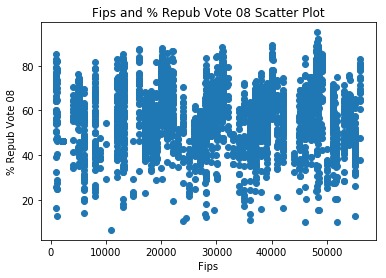

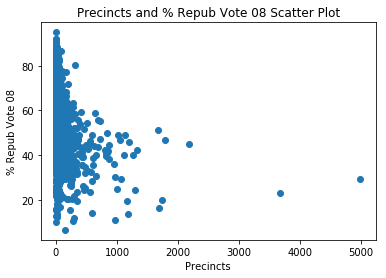

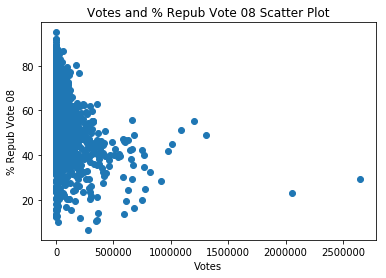

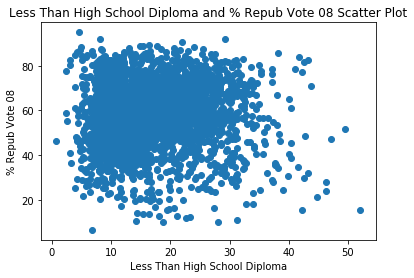

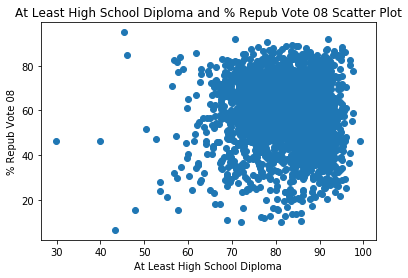

...

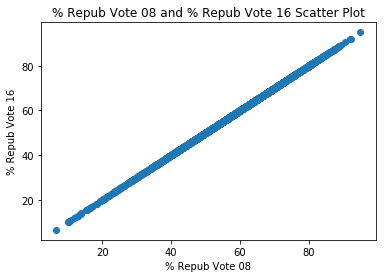

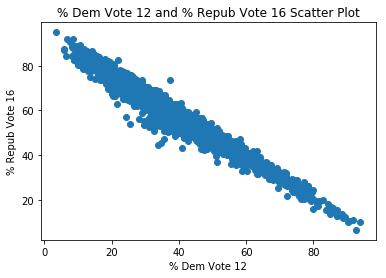

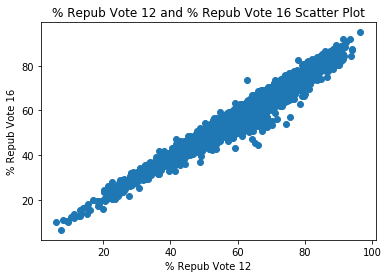

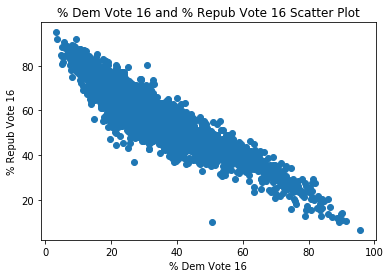

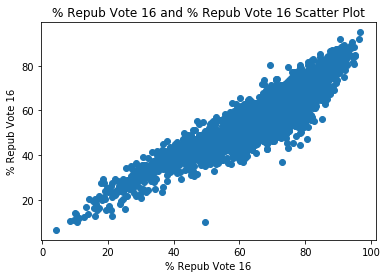

In [1218]:
y_08 = main_data_wvotes_df[repub_08_percent]
y_12 = main_data_wvotes_df[repub_12_percent]
y_16 = main_data_wvotes_df[repub_16_percent]

for elect_year in (repub_08_percent,repub_12_percent,repub_16_percent):
    for col in main_data_wvotes_df.select_dtypes(include=np.number).columns:
        x = np.array(main_data_wvotes_df[col])
        plt.scatter(x,y_08)
        plt.title(f'{col} and {elect_year} Scatter Plot')
        plt.xlabel(f'{col}')
        plt.ylabel(f'{elect_year}')
        plt.show()

In [1220]:
from scipy.stats.stats import pearsonr

for column in main_data_wvotes_df.select_dtypes(include=np.number).columns:
    print(column,main_data_wvotes_df[[column,repub_08_percent]].corr().iloc[0,1],\
          main_data_wvotes_df[[column,repub_12_percent]].corr().iloc[0,1],\
         main_data_wvotes_df[[column,repub_16_percent]].corr().iloc[0,1])

Fips 0.035709897155929725 0.06190698135837905 0.07183658850598588
Precincts -0.25648925425885993 -0.2670248559058049 -0.32988128941367667
Votes -0.28899972455338974 -0.30292277443073107 -0.3951862555441869
Less Than High School Diploma 0.09047044103776702 0.05357439978644532 0.06435706868371661
At Least High School Diploma -0.08690882220606429 -0.05015887421343967 -0.057150731607873026
At Least Bachelors's Degree -0.3047653040051152 -0.3035875535453217 -0.46335069450161276
Graduate Degree -0.3668907241071818 -0.3690399709356628 -0.5153174872189338
School Enrollment -0.12657674042112335 -0.12255851267093325 -0.1533267923567069
Median Earnings 2010 -0.11248269867940493 -0.12096305020876481 -0.19806283666656593
White (Not Latino) Population 0.36243483758210526 0.44933622063132544 0.5687499948506397
African American Population -0.30657329369838665 -0.386982076599062 -0.4528875798684895
Native American Population -0.13536080335639036 -0.13760424961710957 -0.11575052087330838
Asian American 

[Interpretation]
I'd consider any correlation coefficient within -0.1 and +0.1 as weak or no relationships.

A few interesting points to note:

- There is a negative correlation between people with relatively high education level (at least bachelor or graduate degrees) and republican vote. This pattern is consistent among all 3 election years.
- People working in construction/extraction/maintenance/and repair occupations tend to vote for republicans (positive correlation) across the 3 elections.
- As % of household with single parent increases, we also see fewer vote share for republicans.
- Voters who are diabetic seemed to vote republican in 2008 but no longer associated with this political tendency in 2012 election. They, however, returned to republican voting in 2016.
- Uninsured and unemployed groups seem to experience a decline in republican association, almost on the verge of weak correlation in 2016. This is possibly due to the policy difference in Affordable Healthcare Act or the pro-businesses and other Republican political viewpoints.
- Median_age seemd to have stronger positive correlation with republican voting from 2008 to 2016. This corraborated with the past' media coverage of voters turn-out in 2016: majority were senior citizens.

Most other attributes such as Infant mortality rate exhibited no or weak correlation with republican voting.

### EDA Democrats

What about the Democrats?

In [1222]:
dem_08_percent = '% Dem Vote 08'
dem_12_percent = '% Dem Vote 12'
dem_16_percent = '% Dem Vote 16'
for column in main_data_wvotes_df.select_dtypes(include=np.number).columns:
    print(column,main_data_wvotes_df[[column,dem_08_percent]].corr().iloc[0,1],\
          main_data_wvotes_df[[column,dem_12_percent]].corr().iloc[0,1],\
         main_data_wvotes_df[[column,dem_16_percent]].corr().iloc[0,1])

Fips -0.03570989715592967 -0.0619069813583792 -0.07183658850598608
Precincts 0.2564892542588601 0.2670248559058049 0.32988128941367695
Votes 0.28899972455338974 0.3029227744307311 0.3951862555441876
Less Than High School Diploma -0.09047044103776691 -0.05357439978644545 -0.06435706868371673
At Least High School Diploma 0.08690882220606412 0.05015887421343959 0.057150731607873026
At Least Bachelors's Degree 0.30476530400511503 0.3035875535453222 0.46335069450161387
Graduate Degree 0.3668907241071818 0.3690399709356629 0.5153174872189339
School Enrollment 0.12657674042112343 0.12255851267093323 0.15332679235670732
Median Earnings 2010 0.11248269867940479 0.1209630502087649 0.19806283666656616
White (Not Latino) Population -0.36243483758210515 -0.4493362206313257 -0.5687499948506407
African American Population 0.3065732936983874 0.38698207659906275 0.4528875798684908
Native American Population 0.13536080335639025 0.13760424961710946 0.11575052087330862
Asian American Population 0.30416904

In terms of races, only White (non-latino) consistently has a positive correlation with republican votes with a sharp increase in 2016 election compared to the previous two. The rest of the races saw a negative relationship in terms of voting republican, with the two strongest negative correlations belong to two large minority groups Asian American and African American.
Non-white voters, with negative correlation with republican votes, show positive correlation with voting Democrats consistently. Only Native American and Latino voters seemed to show weaker positive correlation compared to the rest.

### EDA at state level

Let's explore the set at the state-level by aggregating the counties for each state.

In [1223]:
#main_data_wvotes_df.groupby(['ST']).corr()
#consider taking weighted mean of vote shares
def state_compute(name,group_df):
    computed_df = pd.DataFrame([name],columns=['State'])
    
    for col in group_df.select_dtypes(include=np.number).columns:
        #if it's a ratio/percentage column, do a weighted average
        
        if ((group_df[col].max() <= 100 and group_df[col].min() >=0) 
            or (group_df[col].max() <= 1 and group_df[col].min() >=0)):
            
            computed_df[col] = np.average(group_df[col],axis=0,weights=group_df['Total Population'])
            
        #else it's a normal numeric column, do a sum
        else:
            computed_df[col] = group_df[col].sum()
    return computed_df

In [1224]:
#create a dummy df from the original by copy() and delete the df data by iloc[0:0]
grouped_main_data_wvotes_df = main_data_wvotes_df.select_dtypes(include=np.number).copy().iloc[0:0]

#call groupby() to create a GroupBy object and iterate through them and call custom func
for name, group in main_data_wvotes_df.groupby('State'):
    computed_all_state_df = state_compute(name,group)
#     print(computed_all_state_df.shape)
    grouped_main_data_wvotes_df = pd.concat([grouped_main_data_wvotes_df,computed_all_state_df])


grouped_main_data_wvotes_df['% Repub Vote 08'] = (grouped_main_data_wvotes_df['Republicans 08 (Votes)']/grouped_main_data_wvotes_df['Total Vote 08'])*100
grouped_main_data_wvotes_df['% Repub Vote 12'] = (grouped_main_data_wvotes_df['Republicans 12 (Votes)']/grouped_main_data_wvotes_df['Total Vote 12'])*100
grouped_main_data_wvotes_df['% Repub Vote 16'] = (grouped_main_data_wvotes_df['votes16_trumpd']/grouped_main_data_wvotes_df['Total Vote 16'])*100
grouped_main_data_wvotes_df['% Dem Vote 08'] = (grouped_main_data_wvotes_df['Democrats 08 (Votes)']/grouped_main_data_wvotes_df['Total Vote 08'])*100
grouped_main_data_wvotes_df['% Dem Vote 12'] = (grouped_main_data_wvotes_df['Democrats 12 (Votes)']/grouped_main_data_wvotes_df['Total Vote 12'])*100
grouped_main_data_wvotes_df['% Dem Vote 16'] = (grouped_main_data_wvotes_df['votes16_clintonh']/grouped_main_data_wvotes_df['Total Vote 16'])*100
     
#checking if the new df is created with the calculated numbers
grouped_main_data_wvotes_df.reset_index(drop=True,inplace=True)
display(grouped_main_data_wvotes_df)

/usr/local/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:8: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  


,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
0,39.109097,38.783771,35.460781,60.890903,61.216229,64.539219,0.330340,0.217906,11.762573,26.018441,...,2.025009e+06,0.074288,0.166317,23816.890000,2078165.0,67.780354,68.835167,37.479124,7.180840e+05,1.306925e+06
1,53.729804,51.987860,50.557251,46.270196,48.012140,49.442749,0.278346,0.207587,4.647219,3.316677,...,1.151629e+06,0.070359,0.214698,9645.378456,0.0,64.856410,69.797822,33.847081,5.822321e+05,5.693971e+05
2,45.686099,45.386620,47.831209,54.313901,54.613380,52.168791,0.242749,0.165049,8.274060,3.579721,...,1.957404e+06,0.084057,0.195738,6102.165923,2062810.0,58.156381,60.686201,35.685766,9.362500e+05,1.021154e+06
3,40.118772,38.129850,36.152743,59.881228,61.870150,63.847257,0.325773,0.220733,11.787450,15.509277,...,1.028395e+06,0.074525,0.201941,25659.045923,1091899.0,74.894422,76.058677,37.332953,3.717930e+05,6.566020e+05
4,62.278450,61.872811,65.277830,37.721550,38.127189,34.722170,0.232899,0.128070,8.707656,5.904774,...,1.127870e+07,0.105859,0.201498,23701.960000,11954317.0,41.348602,53.834886,34.829830,7.362490e+06,3.916209e+06
5,54.550808,52.747988,51.590738,45.449192,47.252012,48.409262,0.203733,0.170128,8.201503,3.714678,...,2.349664e+06,0.081032,0.169922,13025.247768,2564185.0,70.633460,73.253211,35.976608,1.212209e+06,1.137455e+06
6,61.318362,58.773006,56.960980,38.681638,41.226994,43.039020,0.237215,0.148460,6.717337,9.228932,...,1.552698e+06,0.083583,0.100400,2174.771846,1623542.0,72.599210,76.151658,39.465864,8.844320e+05,6.682660e+05
7,62.638139,59.446955,55.999515,37.361861,40.553045,44.000485,0.286576,0.179915,7.388126,20.448787,...,4.206840e+05,0.071068,0.111981,1780.070000,441535.0,66.839597,69.852703,38.366065,2.355810e+05,1.851030e+05
8,93.400768,92.587649,95.749073,6.599232,7.412351,4.250927,0.210000,0.157000,14.400000,52.300000,...,2.717760e+05,0.089000,0.083000,1290.820000,280272.0,33.350000,36.550000,34.300000,2.602230e+05,1.155300e+04
9,51.417696,50.442252,49.341290,48.582304,49.557748,50.658710,0.258319,0.175400,10.659163,15.012858,...,9.091260e+06,0.086751,0.247305,31589.800000,9386750.0,59.202317,61.503496,40.466538,4.485745e+06,4.605515e+06


In [1225]:
for state in main_data_wvotes_df.State.unique():
    display(state,grouped_main_data_wvotes_df.corr())

'Arkansas'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'Georgia'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'Colorado'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'California'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'Illinois'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'Iowa'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'Kentucky'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'Indiana'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'Kansas'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'Michigan'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'Minnesota'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'Missouri'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'Mississippi'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'Montana'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'North Carolina'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'Louisiana'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'Massachusetts'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'Texas'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'Virginia'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'South Dakota'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'Tennessee'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'Washington'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'Wisconsin'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'North Dakota'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'Nebraska'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'New Jersey'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'New Mexico'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'Nevada'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'New York'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'Ohio'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'Oklahoma'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'Pennsylvania'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'Alabama'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'Arizona'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'New Hampshire'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'Vermont'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'West Virginia'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'Wyoming'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'Alaska'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'Oregon'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'Maine'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'Utah'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'Maryland'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'Idaho'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'Delaware'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'Florida'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'South Carolina'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'Rhode Island'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'Connecticut'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'District of Columbia'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


'Hawaii'

,% Dem Vote 08,% Dem Vote 12,% Dem Vote 16,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Adult.obesity,Adult.smoking,Adults 65 and Older Living in Poverty,African American Population,...,Total Vote 16,Unemployment,Uninsured,Violent.crime,Votes,White (Not Latino) Population,White (Not Latino) Population + Asian American Population,median_age,votes16_clintonh,votes16_trumpd
% Dem Vote 08,1.000000,0.985237,0.946217,-1.000000,-0.985237,-0.946217,-0.587603,-0.425736,-0.058338,0.200704,...,0.099629,0.283697,-0.544141,-0.364751,0.097465,-0.378758,-0.284658,0.237228,0.199516,-0.032648
% Dem Vote 12,0.985237,1.000000,0.959126,-0.985237,-1.000000,-0.959126,-0.558009,-0.400093,-0.007090,0.263608,...,0.142831,0.324459,-0.507009,-0.316609,0.138593,-0.432177,-0.344813,0.255339,0.239504,0.012026
% Dem Vote 16,0.946217,0.959126,1.000000,-0.946217,-0.959126,-1.000000,-0.638362,-0.539683,-0.024510,0.299005,...,0.208632,0.357031,-0.422807,-0.251807,0.206286,-0.530729,-0.458777,0.051761,0.308328,0.070059
% Repub Vote 08,-1.000000,-0.985237,-0.946217,1.000000,0.985237,0.946217,0.587603,0.425736,0.058338,-0.200704,...,-0.099629,-0.283697,0.544141,0.364751,-0.097465,0.378758,0.284658,-0.237228,-0.199516,0.032648
% Repub Vote 12,-0.985237,-1.000000,-0.959126,0.985237,1.000000,0.959126,0.558009,0.400093,0.007090,-0.263608,...,-0.142831,-0.324459,0.507009,0.316609,-0.138593,0.432177,0.344813,-0.255339,-0.239504,-0.012026
% Repub Vote 16,-0.946217,-0.959126,-1.000000,0.946217,0.959126,1.000000,0.638362,0.539683,0.024510,-0.299005,...,-0.208632,-0.357031,0.422807,0.251807,-0.206286,0.530729,0.458777,-0.051761,-0.308328,-0.070059
Adult.obesity,-0.587603,-0.558009,-0.638362,0.587603,0.558009,0.638362,1.000000,0.742162,0.338942,0.261240,...,-0.070510,-0.101239,0.227543,0.435926,-0.076223,0.324408,0.226170,0.064801,-0.175628,0.066637
Adult.smoking,-0.425736,-0.400093,-0.539683,0.425736,0.400093,0.539683,0.742162,1.000000,0.343805,0.189437,...,-0.149229,0.060893,0.340206,0.288945,-0.164701,0.205878,0.113977,0.237710,-0.250478,-0.012256
Adults 65 and Older Living in Poverty,-0.058338,-0.007090,-0.024510,0.058338,0.007090,0.024510,0.338942,0.343805,1.000000,0.572078,...,0.087947,0.181638,0.231491,0.398052,0.100285,-0.279580,-0.410168,-0.033103,0.045056,0.136909
African American Population,0.200704,0.263608,0.299005,-0.200704,-0.263608,-0.299005,0.261240,0.189437,0.572078,1.000000,...,0.142567,0.373796,0.056198,0.365160,0.139398,-0.488278,-0.609033,-0.177703,0.112051,0.172605


[Interpretation] Generally, the pattern of voting among races persist at state level. However, there is indeed some deviation among states. For example, white population in HI (Hawaii) vote democrats and not republicans (negative correlation). There are a few interesting change to note:
- in the midwest (ID, IL, IN, KS) native american initially voted for democrats but switched to republican in 2016 election. Similarly in NY and TN. While there are states Native Americans consistently voted republican (OR, PA, RI, etc.), there are states where Native American consistently voted democrats (OK, SC, SD, etc.) 
- while Asian Americans mostly vote democrats, this demographic group in HI voted republican instead. Similarly in MS or SC. There was a change of heart in NH, however, switching from weak correlation (positive for republican in 2008) to gradually increased positive correlation with voting for democrats (2012 and 2016 elections).
- Another big group of democrats voters is lation americans. Overall, the pattern also persists at state level. There are, similar with other ethnic groups, variances among states. E.g. Latinos in MS, NH, and OK voted republic instead of democrats. in the case of MS, it's consistent with voting pattern of asian americans. This is consistent with the actual reported political view of the state.

### EDA % Vote Share

How did people vote across the elections? In this section, let's try to gain some understanding by looking at the distributions of vote shares.

/usr/local/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


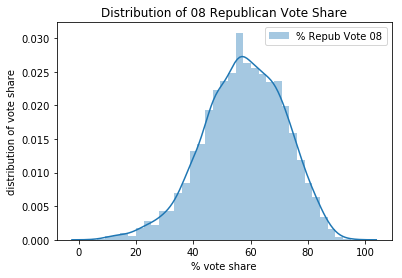

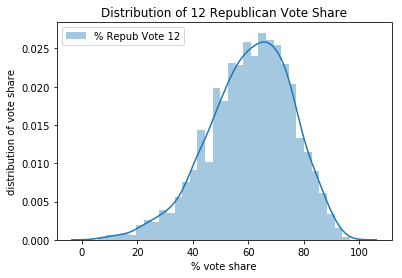

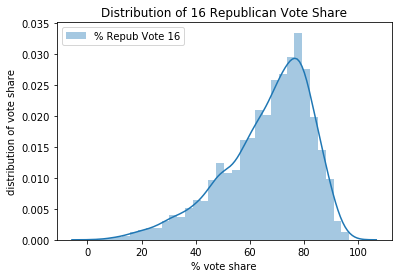

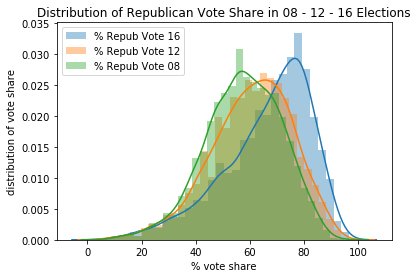

08 Repub Vote Share Variance: 197.00491346269723 
 12 Repub Vote Share Variance: 225.4565338776358 
 16 Repub Vote Share Variance: 259.1713257117406
08 Repub Vote Share Mean: 57.63594726718109 
 12 Repub Vote Share Mean: 60.65005379365233 
 16 Repub Vote Share Mean: 66.54526080691784


In [1226]:
repub_08_vote_share = main_data_wvotes_df[repub_08_percent].values
repub_12_vote_share = main_data_wvotes_df[repub_12_percent].values
repub_16_vote_share = main_data_wvotes_df[repub_16_percent].values

sns.distplot(repub_08_vote_share, label=repub_08_percent)
plt.title('Distribution of 08 Republican Vote Share')
plt.xlabel('% vote share')
plt.ylabel('distribution of vote share')
plt.legend(loc='best')
plt.show()
sns.distplot(repub_12_vote_share, label=repub_12_percent)
plt.title('Distribution of 12 Republican Vote Share')
plt.xlabel('% vote share')
plt.ylabel('distribution of vote share')
plt.legend(loc='best')
plt.show()
sns.distplot(repub_16_vote_share, label=repub_16_percent)
plt.title('Distribution of 16 Republican Vote Share')
plt.xlabel('% vote share')
plt.ylabel('distribution of vote share')
plt.legend(loc='best')
plt.show()

#stacked_shares = np.hstack((repub_08_vote_share,repub_12_vote_share,repub_16_vote_share))
sns.distplot(repub_16_vote_share, label=repub_16_percent)
sns.distplot(repub_12_vote_share, label=repub_12_percent)
sns.distplot(repub_08_vote_share, label=repub_08_percent)
plt.title('Distribution of Republican Vote Share in 08 - 12 - 16 Elections')
plt.xlabel('% vote share')
plt.ylabel('distribution of vote share')
# sns.distplot(stacked_shares, label='stacked')
plt.legend(loc='best')
plt.show()

print('08 Repub Vote Share Variance:',repub_08_vote_share.var(),'\n', \
      '12 Repub Vote Share Variance:',repub_12_vote_share.var(),'\n', \
      '16 Repub Vote Share Variance:',repub_16_vote_share.var())

print('08 Repub Vote Share Mean:',repub_08_vote_share.mean(),'\n', \
      '12 Repub Vote Share Mean:',repub_12_vote_share.mean(),'\n', \
      '16 Repub Vote Share Mean:',repub_16_vote_share.mean())



/usr/local/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


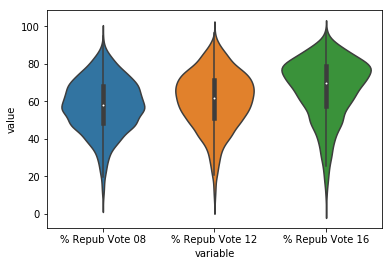

In [1227]:
repub_col_list = ['% Repub Vote 08','% Repub Vote 12','% Repub Vote 16']
transposed_repub_vote_share = pd.melt(main_data_wvotes_df[repub_col_list], value_vars=repub_col_list)
sns.violinplot(x="variable", y="value", data=transposed_repub_vote_share)

Based on the above we can see that:

1- the 3 samples' means differ

2- the distributions of the three year elections' republican vote shares are not of the same shape

3- the variances of the 3 samples also differ

The distribution plots and the combined graph give us visual comparison of the distribution shapes of the 3 data sets in similar scale. Additionally, the violin plot gives us the means, the skewness, and the tails of the 3 election years' data. These visualisations can provide a general sensing of how the 3 data sets would look.

Although simplistic, the observations above can tell us the republican vote shares in 3 years are not the same.

From the plot above, we can guess the shapes of the distributions across 3 election cycles are different, coupled with different variances among 3 groups. To confirm the actual difference, we can conduct ANOVA test with :

$H_0$: $\mu_a$ == $\mu_b$ == $\mu_c$ ... $\mu_n$ (i.e. there is no difference among groups)

$H_a$: There is at least some difference between groups

In [1228]:
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
from scipy import stats

In [1229]:
repub_col_list = ['% Repub Vote 08','% Repub Vote 12','% Repub Vote 16']
transposed_data = pd.melt(main_data_wvotes_df[repub_col_list], value_vars=repub_col_list)

Testing assumption 1: samples have normal distributions

$H_0$: samples are normally distributed

$H_a$: samples are not normally distributed

In [1230]:
#using Shapiro-Wilk test to determine distribution shapes of samples
print(stats.shapiro(np.array(transposed_data[transposed_data['variable']=='% Repub Vote 08']['value'].values)))
print(stats.shapiro(np.array(transposed_data[transposed_data['variable']=='% Repub Vote 12']['value'].values)))
print(stats.shapiro(np.array(transposed_data[transposed_data['variable']=='% Repub Vote 16']['value'].values)))

(0.9917934536933899, 1.9783391504851755e-12)
(0.9857507944107056, 3.0105453460826706e-17)
(0.9450851678848267, 1.0557162519192966e-32)


In [1231]:
from matplotlib import pyplot as plt
%matplotlib inline

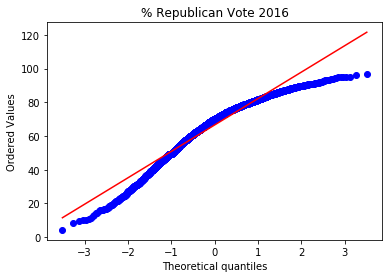

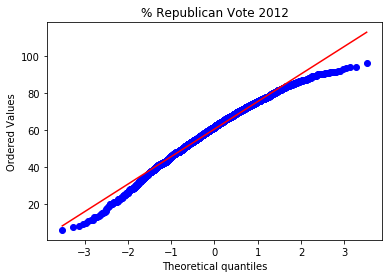

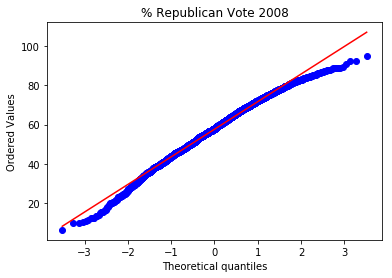

In [1232]:
#using probably plot to verify against shapiro tests
stats.probplot(transposed_data[transposed_data['variable']=='% Repub Vote 16']['value'], plot = plt);
plt.title('% Republican Vote 2016')
plt.show();
stats.probplot(transposed_data[transposed_data['variable']=='% Repub Vote 12']['value'], plot = plt);
plt.title('% Republican Vote 2012')
plt.show();
stats.probplot(transposed_data[transposed_data['variable']=='% Repub Vote 08']['value'], plot = plt);
plt.title('% Republican Vote 2008')
plt.show();

The assumptions for ANOVA testing would need:

- independent samples: this can be affirmed by the nature of data: US national election every 4 years for different candidates and possibly not the same set of voters turning out.
- normally distributed samples: although the Shapiro-Wilk tests failed to reject the null hypothesis, the QQ plot as well as the histograms showed the samples as approx. normally distributed. The only exception is the larger degree of left skew of 2016 data set. This corresponds to the reported information of 2016 election: many people did not turn up or vote for Trump purely as an against-vote to Hilary. That being said, since the same sizes are large, this can be safely ignored.
- homogeneity of variance: the variances computed as well as the histograms show there are differences among the groups. However, as group sizes are equal for all samples, we can safely proceed with the one-way ANOVA test.

In [1233]:
repub_vote_share_lm = ols('value ~ variable', data=transposed_data).fit()
display(repub_vote_share_lm.summary())
display(anova_lm(repub_vote_share_lm))

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  value   R-squared:                       0.057
Model:                            OLS   Adj. R-squared:                  0.057
Method:                 Least Squares   F-statistic:                     283.8
Date:                Sun, 21 Oct 2018   Prob (F-statistic):          2.08e-120
Time:                        20:21:24   Log-Likelihood:                -38935.
No. Observations:                9423   AIC:                         7.788e+04
Df Residuals:                    9420   BIC:                         7.790e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
===============================================================================================
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
Intercept                      57.6359      0.269    214.261      0.000      57.109      58.163
variable[T.% Repub Vote 12]     3.0141      0.380      7.923      0.000       2.268       3.760
variable[T.% Repub Vote 16]     8.9093      0.380     23.420      0.000       8.164       9.655
==============================================================================
Omnibus:                      509.601   Durbin-Watson:                   1.597
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              594.411
Skew:                          -0.601   Prob(JB):                    8.42e-130
Kurtosis:                       3.260   Cond. No.                         3.73
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

,df,sum_sq,mean_sq,F,PR(>F)
variable,2.0,1.290052e+05,64502.618849,283.79834,2.081898e-120
Residual,9420.0,2.141009e+06,227.283285,NaN,NaN


In [1234]:
from statsmodels.stats import multicomp

multicomp.pairwise_tukeyhsd(transposed_data['value'], transposed_data['variable']).summary()

group1,group2,meandiff,lower,upper,reject
% Repub Vote 08,% Repub Vote 12,3.0141,2.1224,3.9058,True
% Repub Vote 08,% Repub Vote 16,8.9093,8.0176,9.8011,True
% Repub Vote 12,% Repub Vote 16,5.8952,5.0035,6.7869,True


In this case, the ANOVA test did provide evidence of the 3 groups being different. By looking at post hoc Tukey test result, we can further confirm that pair-wise comparisons show differences across 3 groups.

### EDA % Vote Share - State Level

Following similar pattern, we will now look at the three elections at the state level to see if the observations at county level persist.

In [1235]:
states_votes_df = main_data_wvotes_df[['ST','Democrats 08 (Votes)','Republicans 08 (Votes)'\
                     ,'Democrats 12 (Votes)','Republicans 12 (Votes)','votes16_trumpd'\
                    ,'votes16_clintonh']].groupby('ST').sum()

In [1236]:
states_votes_df['Total Vote 08'] = states_votes_df['Democrats 08 (Votes)']+\
states_votes_df['Republicans 08 (Votes)']
states_votes_df['Total Vote 12'] = states_votes_df['Democrats 12 (Votes)']+\
states_votes_df['Republicans 12 (Votes)']
states_votes_df['Total Vote 16'] = states_votes_df['votes16_trumpd']+\
states_votes_df['votes16_clintonh']

In [1237]:
#calculate % of the vote counts columns
states_votes_df['% Dem Vote 08'] = (states_votes_df['Democrats 08 (Votes)']/states_votes_df['Total Vote 08'])*100
states_votes_df['% Repub Vote 08'] = (states_votes_df['Republicans 08 (Votes)']/states_votes_df['Total Vote 08'])*100
states_votes_df['% Dem Vote 12'] = (states_votes_df['Democrats 12 (Votes)']/states_votes_df['Total Vote 12'])*100
states_votes_df['% Repub Vote 12'] = (states_votes_df['Republicans 12 (Votes)']/states_votes_df['Total Vote 12'])*100
states_votes_df['% Dem Vote 16'] = (states_votes_df['votes16_clintonh']/states_votes_df['Total Vote 16'])*100
states_votes_df['% Repub Vote 16'] = (states_votes_df['votes16_trumpd']/states_votes_df['Total Vote 16'])*100

/usr/local/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


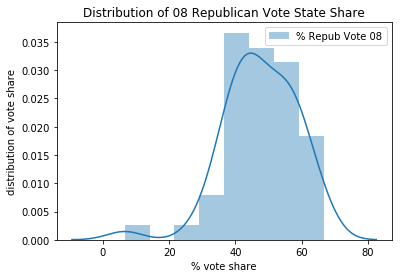

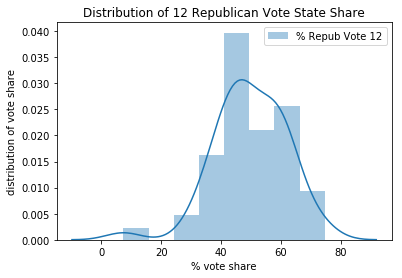

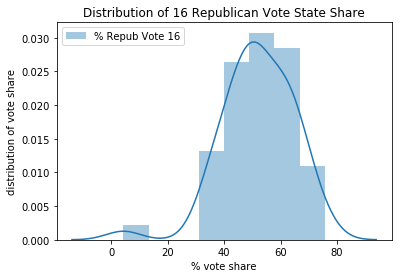

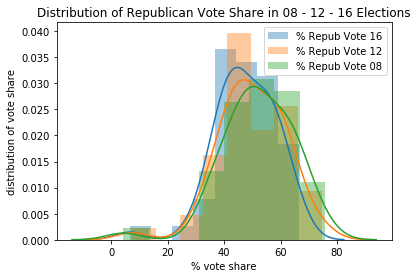

08 Repub Vote State Share Variance: 118.43279913628635 
 12 Repub Vote State Share Variance: 138.9665112500117 
 16 Repub Vote State Share Variance: 156.0719778612745
08 Repub Vote State Share Mean: 47.56664085809366 
 12 Repub Vote State Share Mean: 49.84259281451783 
 16 Repub Vote State Share Mean: 51.99467133168982


In [1238]:
repub_08_vote_state_share = states_votes_df[repub_08_percent].values
repub_12_vote_state_share = states_votes_df[repub_12_percent].values
repub_16_vote_state_share = states_votes_df[repub_16_percent].values

sns.distplot(repub_08_vote_state_share, label=repub_08_percent)
plt.legend(loc='best')
plt.title('Distribution of 08 Republican Vote State Share')
plt.xlabel('% vote share')
plt.ylabel('distribution of vote share')
plt.show()
sns.distplot(repub_12_vote_state_share, label=repub_12_percent)
plt.legend(loc='best')
plt.title('Distribution of 12 Republican Vote State Share')
plt.xlabel('% vote share')
plt.ylabel('distribution of vote share')
plt.show()
sns.distplot(repub_16_vote_state_share, label=repub_16_percent)
plt.legend(loc='best')
plt.title('Distribution of 16 Republican Vote State Share')
plt.xlabel('% vote share')
plt.ylabel('distribution of vote share')
plt.show()


#stacked_shares = np.hstack((repub_08_vote_share,repub_12_vote_share,repub_16_vote_share))
sns.distplot(repub_08_vote_state_share, label=repub_16_percent)
sns.distplot(repub_12_vote_state_share, label=repub_12_percent)
sns.distplot(repub_16_vote_state_share, label=repub_08_percent)
plt.title('Distribution of Republican Vote Share in 08 - 12 - 16 Elections')
plt.xlabel('% vote share')
plt.ylabel('distribution of vote share')
# sns.distplot(stacked_shares, label='stacked')
plt.legend(loc='best')
plt.show()

print('08 Repub Vote State Share Variance:',repub_08_vote_state_share.var(),'\n', \
      '12 Repub Vote State Share Variance:',repub_12_vote_state_share.var(),'\n', \
      '16 Repub Vote State Share Variance:',repub_16_vote_state_share.var())

print('08 Repub Vote State Share Mean:',repub_08_vote_state_share.mean(),'\n', \
      '12 Repub Vote State Share Mean:',repub_12_vote_state_share.mean(),'\n', \
      '16 Repub Vote State Share Mean:',repub_16_vote_state_share.mean())

In [1239]:
transposed_state_data = pd.melt(states_votes_df[repub_col_list], value_vars=repub_col_list)

In [1240]:
#using Shapiro-Wilk test to determine distribution shapes of samples
print(stats.shapiro(np.array(transposed_state_data[transposed_state_data['variable']=='% Repub Vote 08']['value'].values)))
print(stats.shapiro(np.array(transposed_state_data[transposed_state_data['variable']=='% Repub Vote 12']['value'].values)))
print(stats.shapiro(np.array(transposed_state_data[transposed_state_data['variable']=='% Repub Vote 16']['value'].values)))

(0.9435204267501831, 0.01704041101038456)
(0.9595675468444824, 0.07994212955236435)
(0.943414568901062, 0.016872156411409378)


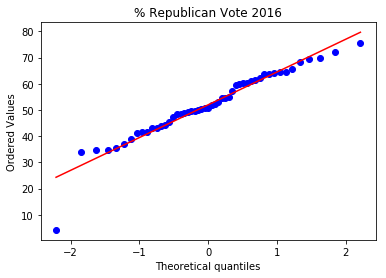

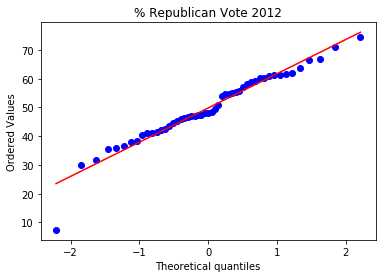

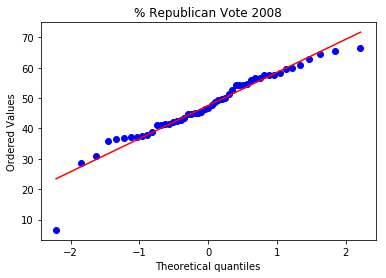

In [1241]:
#using probably plot to verify against shapiro tests
stats.probplot(transposed_state_data[transposed_state_data['variable']=='% Repub Vote 16']['value'], plot = plt);
plt.title('% Republican Vote 2016')
plt.show();
stats.probplot(transposed_state_data[transposed_state_data['variable']=='% Repub Vote 12']['value'], plot = plt);
plt.title('% Republican Vote 2012')
plt.show();
stats.probplot(transposed_state_data[transposed_state_data['variable']=='% Repub Vote 08']['value'], plot = plt);
plt.title('% Republican Vote 2008')
plt.show();

In [1242]:
repub_vote_state_share_lm = ols('value ~ variable', data=transposed_state_data).fit()
display(repub_vote_state_share_lm.summary())
display(anova_lm(repub_vote_state_share_lm))

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  value   R-squared:                       0.023
Model:                            OLS   Adj. R-squared:                  0.010
Method:                 Least Squares   F-statistic:                     1.779
Date:                Sun, 21 Oct 2018   Prob (F-statistic):              0.172
Time:                        20:21:42   Log-Likelihood:                -593.93
No. Observations:                 153   AIC:                             1194.
Df Residuals:                     150   BIC:                             1203.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
===============================================================================================
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
Intercept                      47.5666      1.660     28.650      0.000      44.286      50.847
variable[T.% Repub Vote 12]     2.2760      2.348      0.969      0.334      -2.363       6.915
variable[T.% Repub Vote 16]     4.4280      2.348      1.886      0.061      -0.211       9.067
==============================================================================
Omnibus:                       25.597   Durbin-Watson:                   1.374
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               44.959
Skew:                          -0.804   Prob(JB):                     1.73e-10
Kurtosis:                       5.113   Cond. No.                         3.73
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

,df,sum_sq,mean_sq,F,PR(>F)
variable,2.0,500.120503,250.060252,1.778772,0.172388
Residual,150.0,21087.035701,140.580238,NaN,NaN


In [1243]:
multicomp.pairwise_tukeyhsd(transposed_state_data['value'], transposed_state_data['variable']).summary()

group1,group2,meandiff,lower,upper,reject
% Repub Vote 08,% Repub Vote 12,2.276,-3.2826,7.8345,False
% Repub Vote 08,% Repub Vote 16,4.428,-1.1305,9.9866,False
% Repub Vote 12,% Repub Vote 16,2.1521,-3.4065,7.7106,False


Upon recomputation at state level, the three data sets show more likeness to normal distribution in the QQ plot (the shapiro test only fail to reject the null hypothesis for 2012 data set).

However, in contrast to the county-wise calculation, the state-wise results did not reject the null hypothesis of the ANOVA test. The post hoc Tukey test also showed the pair-wise comparison did not produce meaningful difference across the 3 election cycles.

<a id="modeling_destination"></a>
## Modeling

### Linear Regression

From section 2, the following were identified as having correlation with republican vote share at county level:

- Median age
- education levels (At least bachelors' degree, Graduate degree)
- voters' races (white (not latino) population, african american population, native american population, asian american population, other race or races, lation population)
- occupations (construction.extraction.maintenance.and.repair.occupations)
- % of uninsured people in a county
- % of people with unemployment

The dataset will be split into 2 subsets:

- ~70% ( = 2198) records will be used for training
- 934 records will be used for testing

Aforementioned data points will be used as independent variables. The three data points below will be the dependent variables:

- % of republican vote share

Since the attributes as well as the dependent variable - fraction of votes for either parties - are continuous data, it's appropriate to use Linear regression.

In [1244]:
from sklearn.linear_model import LinearRegression
from sklearn import datasets, linear_model
from sklearn.model_selection import train_test_split
import statsmodels.api as sm

In [1245]:
#continuous independents --> continuous outputs model meets requirements
features_df = main_data_wvotes_df[['median_age'\
                                   ,"At Least Bachelors's Degree"\
                                   ,'Graduate Degree'\
                                   ,'White (Not Latino) Population'\
                                   ,'African American Population'\
                                   ,'Native American Population'\
                                   ,'Asian American Population'\
                                   ,'Other Race or Races'\
                                   ,'Latino Population'
                                   ,'Construction.extraction.maintenance.and.repair.occupations'\
                                   ,'Diabetes'\
                                   ,'Uninsured'\
                                   ,'Unemployment'
                                  ]]

dependent_repub_vote_share_y1 = main_data_wvotes_df[['% Repub Vote 12']]
dependent_repub_vote_share_y2 = main_data_wvotes_df[['% Repub Vote 16']]
dependent_repub_vote_share_y3 = main_data_wvotes_df[['% Repub Vote 08']]
dependent_repub_vote_share = main_data_wvotes_df[['% Repub Vote 08','% Repub Vote 12','% Repub Vote 16']]
#consider statsmodel for linearregression for colinearity
#do a stack of input and output so that we can fit in the model one time
#for the end result, do the linregress graph to see the residual between predicted and expected line

In [1246]:
#testing to fit all proposed attributes
model = sm.OLS(dependent_repub_vote_share_y1, features_df)
results = model.fit()
display(results.summary())

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        % Repub Vote 12   R-squared:                       0.977
Model:                            OLS   Adj. R-squared:                  0.977
Method:                 Least Squares   F-statistic:                 1.032e+04
Date:                Sun, 21 Oct 2018   Prob (F-statistic):               0.00
Time:                        20:21:50   Log-Likelihood:                -11506.
No. Observations:                3141   AIC:                         2.304e+04
Df Residuals:                    3128   BIC:                         2.312e+04
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
==============================================================================================================================
                                                                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------------
median_age                                                    -0.4822      0.041    -11.657      0.000      -0.563      -0.401
At Least Bachelors's Degree                                    0.2985      0.061      4.922      0.000       0.180       0.417
Graduate Degree                                               -1.2634      0.123    -10.266      0.000      -1.505      -1.022
White (Not Latino) Population                                  0.6245      0.023     26.658      0.000       0.579       0.670
African American Population                                    0.0448      0.029      1.520      0.129      -0.013       0.103
Native American Population                                     0.0153      0.033      0.466      0.641      -0.049       0.080
Asian American Population                                      0.1657      0.092      1.802      0.072      -0.015       0.346
Other Race or Races                                            0.1714      0.107      1.607      0.108      -0.038       0.381
Latino Population                                              0.1878      0.026      7.245      0.000       0.137       0.239
Construction.extraction.maintenance.and.repair.occupations     0.4005      0.058      6.888      0.000       0.286       0.514
Diabetes                                                     133.6608     12.070     11.074      0.000     109.995     157.327
Uninsured                                                    126.9642      4.264     29.778      0.000     118.604     135.324
Unemployment                                                -142.5927      7.266    -19.624      0.000    -156.840    -128.345
==============================================================================
Omnibus:                       34.617   Durbin-Watson:                   1.803
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               38.569
Skew:                          -0.210   Prob(JB):                     4.21e-09
Kurtosis:                       3.344   Cond. No.                     6.72e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.72e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

There is a warning regarding strong multicollinearity of the independent variables. At this point, I will calculate correlation matrix of the attributes. 

In [1252]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif_df = pd.DataFrame()
vif_df['Feature'] = features_df.columns
vif_df['VIF_Factor'] = [variance_inflation_factor(features_df.values,index) for index in range(features_df.shape[1])]

display(vif_df)

,Feature,VIF_Factor
0,median_age,97.058787
1,At Least Bachelors's Degree,56.385872
2,Graduate Degree,30.035621
3,White (Not Latino) Population,127.176304
4,African American Population,8.642957
5,Native American Population,2.222227
6,Asian American Population,2.127107
7,Other Race or Races,2.518489
8,Latino Population,5.441571
9,Construction.extraction.maintenance.and.repair...,17.126339


In [1247]:
corr_values = np.corrcoef(features_df,rowvar=0)
w,v = np.linalg.eig(corr_values)
print(w)

[3.25774613e+00 2.66828961e+00 1.64965887e+00 1.30793982e+00
 9.47919488e-01 5.83736548e-02 2.85412306e-06 2.90788201e-01
 3.91549892e-01 4.14437680e-01 6.26271648e-01 6.92906796e-01
 6.94115359e-01]


It looks like eigen value for "Native American Population", "Asian American Population" is pretty close to 0 hence we can further inspect its eigen vector to see this attributes varies along with other attributes.

In [1248]:
print(v[:,5])
print(v[:,6])

[ 0.05330185 -0.73600851  0.64723122 -0.02560242  0.05101413  0.01870491
  0.00298164 -0.00873224 -0.02835993 -0.02169664 -0.15126946  0.01452655
 -0.09209071]
[ 5.28907307e-05 -1.49658579e-04  1.71454409e-04  6.83434332e-01
  5.00992136e-01  2.58344543e-01  8.47848344e-02  6.62375963e-02
  4.51227810e-01  5.89229157e-05 -3.72160552e-05 -8.11510547e-05
 -3.10905922e-05]


Based on the column's vector above, we can see that "Asian American Population" and "African American Population", "Native American Population", "Latino Population" are colinear.

"Native American Population" and "Graduate Degree", "Diabetes", "At Least Bachelors's Degree" are colinear.

In [1253]:
#continue with the process above to eliminate collinearity among initially selected columns
corr_values_2 = np.corrcoef(features_df.drop(columns=['African American Population'\
                                                      ,'Native American Population',
                                                      "At Least Bachelors's Degree",'Latino Population',
                                                      'Diabetes'  ]\
                                             ,axis=1),rowvar=0)
print('Columns left',features_df.drop(columns=['African American Population'\
                                                      ,'Native American Population',
                                                      "At Least Bachelors's Degree",
                                                     'Latino Population','Diabetes' ]\
                                             ,axis=1).columns)
w_2,v_2 = np.linalg.eig(corr_values_2)
print(w_2)

Columns left Index(['median_age', 'Graduate Degree', 'White (Not Latino) Population',
       'Asian American Population', 'Other Race or Races',
       'Construction.extraction.maintenance.and.repair.occupations',
       'Uninsured', 'Unemployment'],
      dtype='object')
[2.17198356 1.94374901 1.06325536 0.87871928 0.31186713 0.57812663
 0.62734747 0.42495157]


In [1254]:
print(v_2[:,6])

[ 0.20836575 -0.38534513 -0.2294406  -0.18943605  0.13246599 -0.74582148
  0.23700215 -0.29932741]


From the new eigen values above, we can see deduce that the last four columns are collinear, hence we can remove them from the final model.

In [1255]:
updated_features_df = features_df.drop(columns=['Latino Population'
             ,'Native American Population',
              'median_age',                                 
              'Other Race or Races',
              'At Least Bachelors\'s Degree',                                  
            'Asian American Population',
              'Unemployment',
               'Uninsured'   
            ,  'Diabetes'
              ],axis=1)

In [1256]:
#testing after removing collinearity attributes
model_post_colinear_removed_test = sm.OLS(dependent_repub_vote_share_y1,sm.add_constant(updated_features_df))
results_post_colinear_removed_test = model_post_colinear_removed_test.fit()
display(results_post_colinear_removed_test.summary())

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        % Repub Vote 12   R-squared:                       0.390
Model:                            OLS   Adj. R-squared:                  0.389
Method:                 Least Squares   F-statistic:                     501.7
Date:                Sun, 21 Oct 2018   Prob (F-statistic):               0.00
Time:                        20:57:16   Log-Likelihood:                -12189.
No. Observations:                3141   AIC:                         2.439e+04
Df Residuals:                    3136   BIC:                         2.442e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
==============================================================================================================================
                                                                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------------
const                                                         39.3715      1.610     24.450      0.000      36.214      42.529
Graduate Degree                                               -1.1083      0.059    -18.724      0.000      -1.224      -0.992
White (Not Latino) Population                                  0.2460      0.014     18.072      0.000       0.219       0.273
African American Population                                   -0.1863      0.019     -9.986      0.000      -0.223      -0.150
Construction.extraction.maintenance.and.repair.occupations     0.9269      0.068     13.695      0.000       0.794       1.060
==============================================================================
Omnibus:                        9.266   Durbin-Watson:                   1.492
Prob(Omnibus):                  0.010   Jarque-Bera (JB):                8.674
Skew:                          -0.093   Prob(JB):                       0.0131
Kurtosis:                       2.823   Cond. No.                         635.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1257]:
#with the multicollinearity warning closed, proceed to modelling.
#create a function to loop through each year of election and create a test-train set
def fit_model(y_list,x_list,test_sample_size):
    # create training and testing vars
    print(f'Start modelling for {y_list.columns}')
    X_train, X_test, y_train, y_test = train_test_split(x_list, y_list, test_size=test_sample_size)
    
    #start model and fit
    model_post_colinear_removed = sm.OLS(y_train,sm.add_constant(X_train))
    results_post_colinear_removed = model_post_colinear_removed.fit()
    display(results_post_colinear_removed.summary())
    
    #making prediction
    prediction = results_post_colinear_removed.predict(exog=sm.add_constant(X_test))
    
    #plotting distribution and compare with a normal distribution
    residuals = y_test.T.values[0] - prediction.values
    sns.distplot(residuals,fit=stats.norm, label="vote share residuals")
    plt.legend(loc='best')
    plt.title('Residuals Distribution Plot')
    plt.xlabel(f'Residuals of predicted vs observed {y_list.columns}')
    plt.ylabel('distribution of vote share')
    plt.show()
    print('Residuals mean:',residuals.mean())
    
    #plotting regression line with predicted vote share as X and 
    #observed values as y --> display linear relationship as well as residual plot
    fig, ax = plt.subplots(1,2)
    sns.regplot('x', 'y', pd.DataFrame({'x':prediction.values, 'y':y_test.T.values[0]}), ax = ax[0])
    sns.residplot('x', 'y', pd.DataFrame({'x':prediction.values, 'y':y_test.T.values[0]}), ax = ax[1])
    plt.show()

Start modelling for Index(['% Repub Vote 08'], dtype='object')


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        % Repub Vote 08   R-squared:                       0.323
Model:                            OLS   Adj. R-squared:                  0.322
Method:                 Least Squares   F-statistic:                     261.6
Date:                Sun, 21 Oct 2018   Prob (F-statistic):          5.58e-184
Time:                        20:59:14   Log-Likelihood:                -8493.7
No. Observations:                2198   AIC:                         1.700e+04
Df Residuals:                    2193   BIC:                         1.703e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
==============================================================================================================================
                                                                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------------
const                                                         39.8050      1.913     20.808      0.000      36.053      43.556
Graduate Degree                                               -1.0077      0.068    -14.906      0.000      -1.140      -0.875
White (Not Latino) Population                                  0.1824      0.016     11.074      0.000       0.150       0.215
African American Population                                   -0.1275      0.022     -5.703      0.000      -0.171      -0.084
Construction.extraction.maintenance.and.repair.occupations     0.9580      0.079     12.071      0.000       0.802       1.114
==============================================================================
Omnibus:                        8.114   Durbin-Watson:                   2.045
Prob(Omnibus):                  0.017   Jarque-Bera (JB):                6.439
Skew:                          -0.024   Prob(JB):                       0.0400
Kurtosis:                       2.739   Cond. No.                         642.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

/usr/local/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


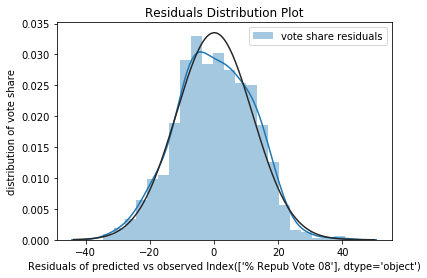

Residuals mean: 0.12379139236212493


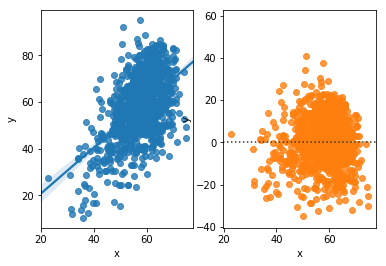

Start modelling for Index(['% Repub Vote 12'], dtype='object')


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        % Repub Vote 12   R-squared:                       0.399
Model:                            OLS   Adj. R-squared:                  0.398
Method:                 Least Squares   F-statistic:                     364.5
Date:                Sun, 21 Oct 2018   Prob (F-statistic):          8.55e-241
Time:                        20:59:15   Log-Likelihood:                -8528.6
No. Observations:                2198   AIC:                         1.707e+04
Df Residuals:                    2193   BIC:                         1.710e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
==============================================================================================================================
                                                                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------------
const                                                         38.5927      1.931     19.989      0.000      34.807      42.379
Graduate Degree                                               -1.1045      0.072    -15.350      0.000      -1.246      -0.963
White (Not Latino) Population                                  0.2595      0.016     16.042      0.000       0.228       0.291
African American Population                                   -0.1815      0.022     -8.248      0.000      -0.225      -0.138
Construction.extraction.maintenance.and.repair.occupations     0.8920      0.081     10.961      0.000       0.732       1.052
==============================================================================
Omnibus:                        4.504   Durbin-Watson:                   2.040
Prob(Omnibus):                  0.105   Jarque-Bera (JB):                4.352
Skew:                          -0.078   Prob(JB):                        0.113
Kurtosis:                       2.848   Cond. No.                         635.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

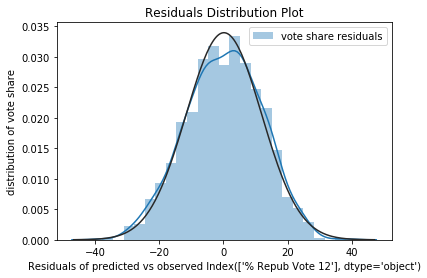

Residuals mean: 0.1516354427917808


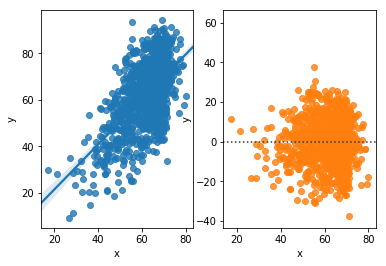

Start modelling for Index(['% Repub Vote 16'], dtype='object')


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        % Repub Vote 16   R-squared:                       0.616
Model:                            OLS   Adj. R-squared:                  0.616
Method:                 Least Squares   F-statistic:                     880.8
Date:                Sun, 21 Oct 2018   Prob (F-statistic):               0.00
Time:                        20:59:15   Log-Likelihood:                -8203.9
No. Observations:                2198   AIC:                         1.642e+04
Df Residuals:                    2193   BIC:                         1.645e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
==============================================================================================================================
                                                                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------------
const                                                         42.9959      1.647     26.103      0.000      39.766      46.226
Graduate Degree                                               -1.9072      0.061    -31.011      0.000      -2.028      -1.787
White (Not Latino) Population                                  0.3610      0.014     26.059      0.000       0.334       0.388
African American Population                                   -0.1965      0.019    -10.141      0.000      -0.235      -0.159
Construction.extraction.maintenance.and.repair.occupations     0.7887      0.069     11.449      0.000       0.654       0.924
==============================================================================
Omnibus:                       16.292   Durbin-Watson:                   2.074
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               16.563
Skew:                          -0.196   Prob(JB):                     0.000253
Kurtosis:                       3.165   Cond. No.                         629.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

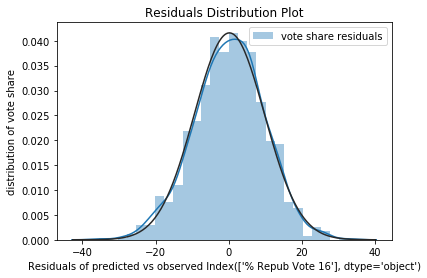

Residuals mean: 0.15414546890936454


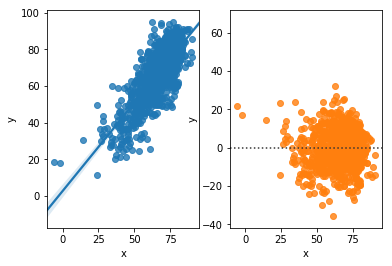

In [1259]:
#start modelling three years of predictions with a for loop
for column in dependent_repub_vote_share:
    fit_model(dependent_repub_vote_share[[column]],updated_features_df,0.3)

### Logistic Regression

What if we were to treat the % vote share as a binary outcome with respect to a political party? Since the last 3 presidential elections in the US only have Democrats and Republicans as major players, this simplified approach may suffice.

In [1260]:
display(ec_df.EC_votes.sum()/2)

269.0

In order to be elected president, a candidate has to win a majority of electoral college votes, which in this case, translates to a minimum of 270 ec votes. This will be used as the basis to determine the election outcome as well as model prediction outcome.

For this problem, I will also use the same list of attributes from Part 4.

In [1261]:
state_features_df = main_data_wvotes_df[['State','Total Population',
                  'Graduate Degree','White (Not Latino) Population' ,
                'African American Population',
            'Construction.extraction.maintenance.and.repair.occupations','Total Vote 08'
,'Total Vote 12','Total Vote 16' ,
'Republicans 08 (Votes)' ,'Republicans 12 (Votes)','votes16_trumpd'                                      
              ]]
#dependent_repub_state_vote_share = main_data_wvotes_df[['% Repub Vote 08','% Repub Vote 12','% Repub Vote 16']]

Since the analysis requires data to be aggregated to state-level, there needs to be an aggregation function for each attributes. Given that there is a mix of ratio and cardinal numbers, a reasonable aggregation will be weighted average for each state, based on individual county' population in corresponding state.

In [1262]:
#for each group and name passed in
#create a temp df with first column being the sum of the param df population column
#add in the name of the state, and then compute the weighted average for each column after
#this function produces only a df of 1 row and 6 columns
def func_to_perform(name,group_df):
    #computed_df = pd.DataFrame([np.sum(group_df['Total Population'].values)],columns=['Total Population'])
    #computed_df['State'] = name
    computed_df = pd.DataFrame([name],columns=['State'])
    #computed_df['Total Population'] = group_df['Total Population'].sum()
    #total_pop = group_df['Total Population'].sum()
    for col in group_df.columns[2:6]:
        #computed_df[col] = np.average(group_df[col],axis=0,weights=group_df['Total Population'])
        computed_df[col] = np.average(group_df[col],axis=0,weights=group_df['Total Population'])
    computed_df['Total Vote 08'] = group_df['Total Vote 08'].sum()
    computed_df['Total Vote 12'] = group_df['Total Vote 12'].sum()
    computed_df['Total Vote 16'] = group_df['Total Vote 16'].sum()
    for col in group_df.columns[9:]:
        #computed_df[col] = np.average(group_df[col],axis=0,weights=group_df['Total Population'])
        #for each column from republican vote share, get the index of the current col 
        #then move back 3 indices to the corresponding total annual vote of the state for both parties
        computed_df[col] = group_df[col].sum()

    return computed_df

In [1263]:
#create a dummy df from the original by copy() and delete the df data by iloc[0:0]
grouped_state_features_df = state_features_df.loc[:,state_features_df.columns!=\
                                              'Total Population'].copy().iloc[0:0]

#call groupby() to create a GroupBy object and iterate through them and call custom func
for name, group in state_features_df.groupby('State'):
    computed_state_df = func_to_perform(name,group)
    grouped_state_features_df = pd.concat([grouped_state_features_df,computed_state_df])


grouped_state_features_df['% Repub Vote 08'] = (grouped_state_features_df['Republicans 08 (Votes)']/grouped_state_features_df['Total Vote 08'])*100
grouped_state_features_df['% Repub Vote 12'] = (grouped_state_features_df['Republicans 12 (Votes)']/grouped_state_features_df['Total Vote 12'])*100
grouped_state_features_df['% Repub Vote 16'] = (grouped_state_features_df['votes16_trumpd']/grouped_state_features_df['Total Vote 16'])*100
    
#checking if the new df is created with the calculated numbers
grouped_state_features_df.reset_index(drop=True,inplace=True)
display(grouped_state_features_df)

,State,Graduate Degree,White (Not Latino) Population,African American Population,Construction.extraction.maintenance.and.repair.occupations,Total Vote 08,Total Vote 12,Total Vote 16,Republicans 08 (Votes),Republicans 12 (Votes),votes16_trumpd,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16
0,Alabama,7.957862,67.780354,26.018441,10.972674,2.080025e+06,2.051621e+06,2.025009e+06,1.266546e+06,1.255925e+06,1.306925e+06,60.890903,61.216229,64.539219
1,Alaska,9.583721,64.856410,3.316677,12.219290,1.203847e+06,1.179779e+06,1.151629e+06,5.570224e+05,5.664373e+05,5.693971e+05,46.270196,48.012140,49.442749
2,Arizona,9.641806,58.156381,3.579721,10.971168,2.264818e+06,2.258886e+06,1.957404e+06,1.230111e+06,1.233654e+06,1.021154e+06,54.313901,54.613380,52.168791
3,Arkansas,6.482003,74.894422,15.509277,10.275469,1.033748e+06,1.015480e+06,1.028395e+06,6.190210e+05,6.282790e+05,6.566020e+05,59.881228,61.870150,63.847257
4,California,10.674523,41.348602,5.904774,8.811037,1.328625e+07,1.269424e+07,1.127870e+07,5.011781e+06,4.839958e+06,3.916209e+06,37.721550,38.127189,34.722170
5,Colorado,12.867324,70.633460,3.714678,10.316877,2.362262e+06,2.508344e+06,2.349664e+06,1.073629e+06,1.185243e+06,1.137455e+06,45.449192,47.252012,48.409262
6,Connecticut,15.327307,72.599210,9.228932,7.977128,1.627201e+06,1.540008e+06,1.552698e+06,6.294280e+05,6.348990e+05,6.682660e+05,38.681638,41.226994,43.039020
7,Delaware,11.088175,66.839597,20.448787,9.354990,4.078330e+05,4.080680e+05,4.206840e+05,1.523740e+05,1.654840e+05,1.851030e+05,37.361861,40.553045,44.000485
8,District of Columbia,13.600000,33.350000,52.300000,3.300000,2.631670e+05,2.884510e+05,2.717760e+05,1.736700e+04,2.138100e+04,1.155300e+04,6.599232,7.412351,4.250927
9,Florida,9.189241,59.202317,15.012858,10.422897,8.328586e+06,8.401203e+06,9.091260e+06,4.046219e+06,4.163447e+06,4.605515e+06,48.582304,49.557748,50.658710


To predict the election result, we will need to know the number of electoral college votes a Republican candidate would receive. This will be based on the % of vote share (s)he would receive at each state (if it's more than half since there is only two choices Dems Vs Republicans in each state in our dataset). The process is:

1- In order to predict based on a test dataset, we need to compute estimated % vote share of republican would have received

2- Tranform that % into a Yes/No(1/0) for whether republican candidate won that state (meaning getting the majority of % vote share and hence getting all the electoral college vote that state has)

In [1265]:
grouped_state_features_df['Republican 08'] = np.where(\
grouped_state_features_df['% Repub Vote 08'] > 50,1, 0)
grouped_state_features_df['Republican 12'] = np.where(\
grouped_state_features_df['% Repub Vote 12'] > 50,1, 0)
grouped_state_features_df['Republican 16'] = np.where(\
grouped_state_features_df['% Repub Vote 16'] > 50,1, 0)

In [1266]:
display(grouped_state_features_df)

,State,Graduate Degree,White (Not Latino) Population,African American Population,Construction.extraction.maintenance.and.repair.occupations,Total Vote 08,Total Vote 12,Total Vote 16,Republicans 08 (Votes),Republicans 12 (Votes),votes16_trumpd,% Repub Vote 08,% Repub Vote 12,% Repub Vote 16,Republican 08,Republican 12,Republican 16
0,Alabama,7.957862,67.780354,26.018441,10.972674,2.080025e+06,2.051621e+06,2.025009e+06,1.266546e+06,1.255925e+06,1.306925e+06,60.890903,61.216229,64.539219,1,1,1
1,Alaska,9.583721,64.856410,3.316677,12.219290,1.203847e+06,1.179779e+06,1.151629e+06,5.570224e+05,5.664373e+05,5.693971e+05,46.270196,48.012140,49.442749,0,0,0
2,Arizona,9.641806,58.156381,3.579721,10.971168,2.264818e+06,2.258886e+06,1.957404e+06,1.230111e+06,1.233654e+06,1.021154e+06,54.313901,54.613380,52.168791,1,1,1
3,Arkansas,6.482003,74.894422,15.509277,10.275469,1.033748e+06,1.015480e+06,1.028395e+06,6.190210e+05,6.282790e+05,6.566020e+05,59.881228,61.870150,63.847257,1,1,1
4,California,10.674523,41.348602,5.904774,8.811037,1.328625e+07,1.269424e+07,1.127870e+07,5.011781e+06,4.839958e+06,3.916209e+06,37.721550,38.127189,34.722170,0,0,0
5,Colorado,12.867324,70.633460,3.714678,10.316877,2.362262e+06,2.508344e+06,2.349664e+06,1.073629e+06,1.185243e+06,1.137455e+06,45.449192,47.252012,48.409262,0,0,0
6,Connecticut,15.327307,72.599210,9.228932,7.977128,1.627201e+06,1.540008e+06,1.552698e+06,6.294280e+05,6.348990e+05,6.682660e+05,38.681638,41.226994,43.039020,0,0,0
7,Delaware,11.088175,66.839597,20.448787,9.354990,4.078330e+05,4.080680e+05,4.206840e+05,1.523740e+05,1.654840e+05,1.851030e+05,37.361861,40.553045,44.000485,0,0,0
8,District of Columbia,13.600000,33.350000,52.300000,3.300000,2.631670e+05,2.884510e+05,2.717760e+05,1.736700e+04,2.138100e+04,1.155300e+04,6.599232,7.412351,4.250927,0,0,0
9,Florida,9.189241,59.202317,15.012858,10.422897,8.328586e+06,8.401203e+06,9.091260e+06,4.046219e+06,4.163447e+06,4.605515e+06,48.582304,49.557748,50.658710,0,0,1


In [1267]:
from scipy import stats, special
from sklearn.linear_model import LogisticRegression
from sklearn import model_selection, metrics, linear_model, feature_selection

In [1268]:
x = np.vstack((grouped_state_features_df[['Graduate Degree','White (Not Latino) Population' ,
                'African American Population',
            'Construction.extraction.maintenance.and.repair.occupations']].values,
               grouped_state_features_df[['Graduate Degree','White (Not Latino) Population' ,
                'African American Population',
            'Construction.extraction.maintenance.and.repair.occupations']].values))

y = np.hstack((grouped_state_features_df['Republican 08']
              ,grouped_state_features_df['Republican 12']))

In [1269]:
logit = LogisticRegression()
logit.fit(x,y.T)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [1270]:
print('grad_degree_coef',logit.coef_[0][0])
print('white_coef',logit.coef_[0][0])
print('african_coef',logit.coef_[0][0])
print('construction_coef',logit.coef_[0][0])

grad_degree_coef -0.9726506507933267
white_coef -0.9726506507933267
african_coef -0.9726506507933267
construction_coef -0.9726506507933267


In [1271]:
prediction_x = grouped_state_features_df[['Graduate Degree','White (Not Latino) Population' ,
                'African American Population',
            'Construction.extraction.maintenance.and.repair.occupations']].values

prediction_16_repub = logit.predict(prediction_x)
prediction_result_ls = []
for i, d_i in enumerate(prediction_x):
    state = grouped_state_features_df.iloc[i,0]
    prediction_result_ls.append([state,prediction_16_repub[i]])
    verdict = f'republican wins this state {state}' if prediction_16_repub[i] == 1 else f'republican loses this state {state}'
    print(f'Model predicts {verdict}')
predicted_states_votes_df = pd.DataFrame(prediction_result_ls,columns=['State','2016_Prediction'])

Model predicts republican wins this state Alabama
Model predicts republican wins this state Alaska
Model predicts republican loses this state Arizona
Model predicts republican wins this state Arkansas
Model predicts republican loses this state California
Model predicts republican loses this state Colorado
Model predicts republican loses this state Connecticut
Model predicts republican loses this state Delaware
Model predicts republican loses this state District of Columbia
Model predicts republican wins this state Florida
Model predicts republican wins this state Georgia
Model predicts republican loses this state Hawaii
Model predicts republican wins this state Idaho
Model predicts republican loses this state Illinois
Model predicts republican wins this state Indiana
Model predicts republican wins this state Iowa
Model predicts republican loses this state Kansas
Model predicts republican wins this state Kentucky
Model predicts republican wins this state Louisiana
Model predicts republi

In [1272]:
#getting the ec votes per state into the predicted dataframe
predicted_states_votes_ec_df = predicted_states_votes_df.merge(
    ec_df,how='outer',on='State')

In [1273]:
#populate the predicted ec vote counts a republican candidate would have received
predicted_states_votes_ec_df['Predicted_ec'] = np.where(
    predicted_states_votes_ec_df['2016_Prediction']==1,predicted_states_votes_ec_df['EC_votes'],0)

In [1274]:
#print out the final total predicted ec vote count
predicted_states_votes_ec_df['Predicted_ec'].sum()

213

Unfortunately, my model predicted not very close to reality of 2016 election. Then again, i believed for the past predictions, the 2016 election result was rather unexpected. :)